In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import os
from owi_data_2_pandas.io import API
import datetime
from pytz import utc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Import vub Meetenet Vlaamse Banken API functions
from vubmvbc.config import Credentials
from vubmvbc.client import Base
from vubmvbc.objects import Catalog, Data
import vubmvbc.data_getter as dg

from oma_tracking.oma_clustering import ModeClusterer
from oma_tracking.data.make_dataset import get_mpe_data
from oma_tracking.data.utils import read_simulations_csv_files


c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\numpy\.libs\libopenblas.4SP5SUA7CBGXUEOC35YP2ASOICYYEQZZ.gfortran-win_amd64.dll
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\numpy\.libs\libopenblas.XWYDX2IKJW2NMTWSFYNGFUWKQU3LYTCZ.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.1.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


In [2]:
start =  datetime.datetime(2022,11,1,tzinfo=utc)
stop  = datetime.datetime(2023,5,4,tzinfo=utc)
end_date = datetime.datetime(2023,4,1,tzinfo=utc)
location = 'nw2d01'
name_location = 'NW2_D01'
home_folder = "../../../"
data_path = home_folder + "data/nw2/raw/" + location + "_" + start.strftime("%Y%m%d") + "_" + stop.strftime("%Y%m%d") + ".parquet"
weather_data_path = home_folder + "data/nw2/mvbc_data.parquet"
tracked_frequencies_path = home_folder + "data/nw2/tracked_modes/harmonics_removed/" + location + ".parquet"
simulations_data_path = home_folder + "data/nw2/simulations/" + location + "/"

turbine_data = pd.read_parquet(data_path).loc[:end_date]
turbine_data = turbine_data.loc[~turbine_data.index.duplicated(keep='first')]
weather_station_data_LAT = pd.read_parquet(weather_data_path).loc[:end_date]


# Get all the data
data = pd.read_parquet(data_path).loc[:end_date]
mvbc_data = pd.read_parquet(weather_data_path).loc[:end_date]
tracked_frequencies = pd.read_parquet(tracked_frequencies_path).loc[:end_date]
simulation_data = read_simulations_csv_files(simulations_data_path + "eigen_frequencies/")
simulation_shifts = read_simulations_csv_files(simulations_data_path + "mean_shifts/")
simulation_errors = pd.read_csv(simulations_data_path + "errors/Errors_No_scour.csv", index_col=0)


name_location = 'NW2_D01'
mpe_data = {}
directions = ['SS', 'FA']
for direction in directions:
    mpe_data[direction] = get_mpe_data(turbine_data, direction, name_location)

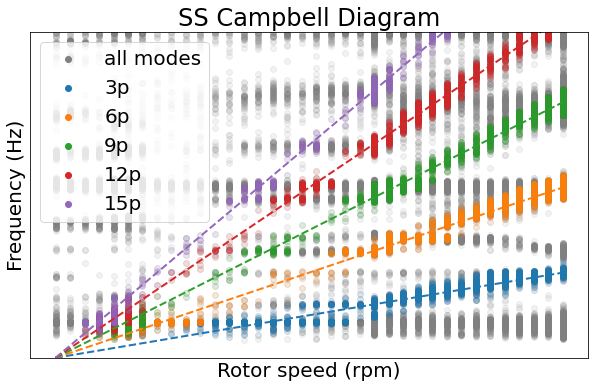

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


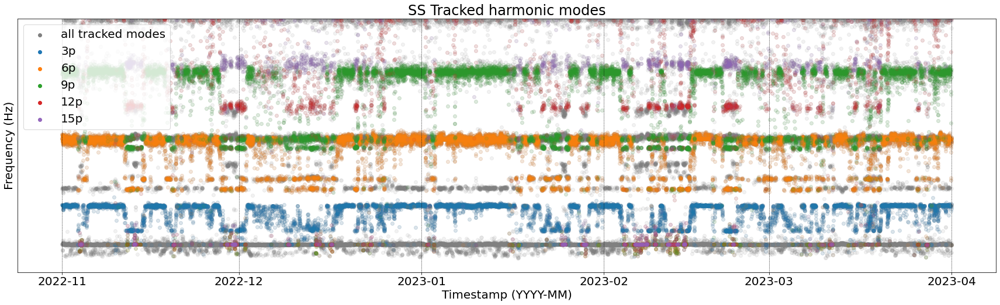

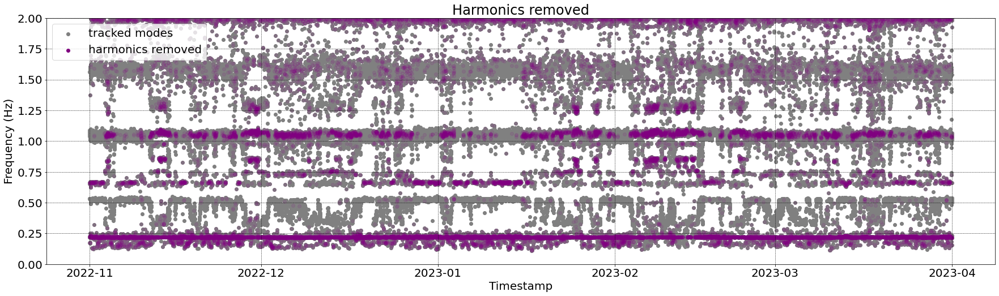

In [3]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
plt.rcParams.update({'font.size': 20})
clustering_data = {}
harmonic_detectors = {}
harmonics_removed = {}
for direction in ['SS']:
    clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
    harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=0, max_distance = 0.08, p_orders=[3,6,9,12, 15])
    distance_calculator_data = harmonic_detectors[direction].get_distance_calculator_data()
    harmonic_detectors[direction].plot_distances()
    harmonic_detectors[direction].plot_harmonics_removed()
    harmonics_removed[direction] = harmonic_detectors[direction].remove_harmonics()


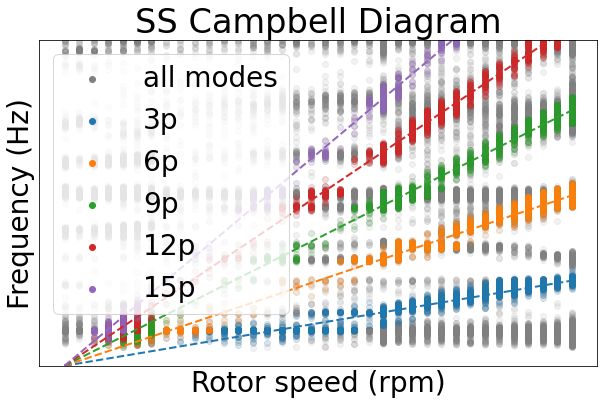

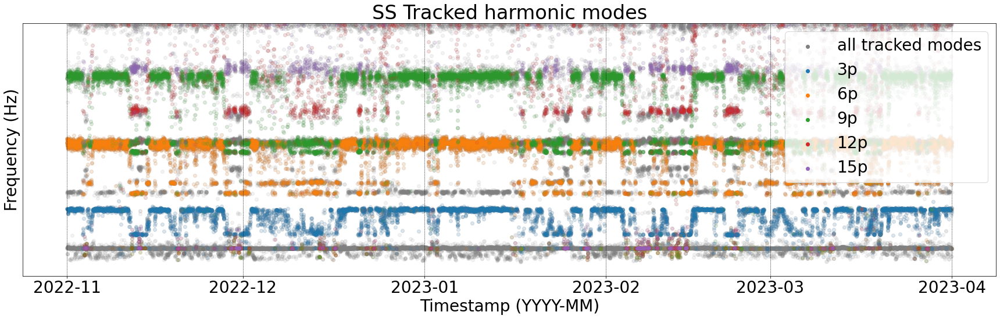

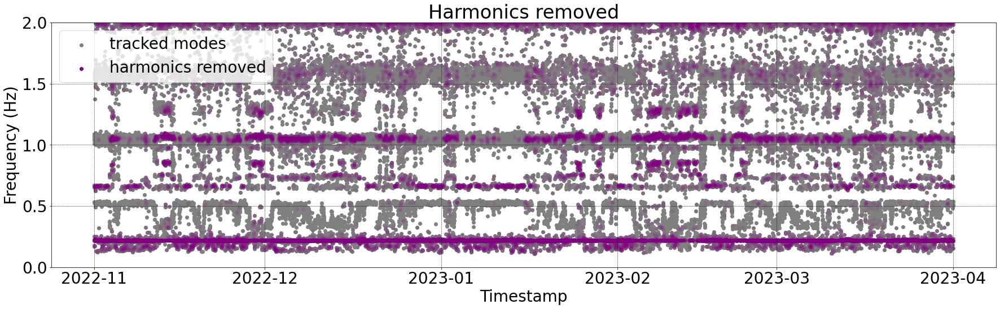

In [4]:
from oma_tracking.modal_tracking.harmonics import HarmonicDetector
plt.rcParams.update({'font.size': 28})  # Set the font size to 12
clustering_data = {}
harmonic_detectors = {}
harmonics_removed = {}
for direction in ['SS']:
    clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})
    harmonic_detectors[direction] = HarmonicDetector(turbine_data, clustering_data[direction], min_rpm=0, max_distance = 0.08, p_orders=[3,6,9,12, 15])
    distance_calculator_data = harmonic_detectors[direction].get_distance_calculator_data()
    harmonic_detectors[direction].plot_distances()
    harmonic_detectors[direction].plot_harmonics_removed()
    harmonics_removed[direction] = harmonic_detectors[direction].remove_harmonics()


In [5]:
mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'})

,algorithm,damping,frequency,size,std_damping,std_frequency
timestamp,,,,,,
2022-11-01 00:00:00+00:00,lscf,4.806132,0.220005,30,0.285902,0.002627
2022-11-01 00:00:00+00:00,lscf,3.664014,0.534838,25,0.498005,0.002628
2022-11-01 00:00:00+00:00,lscf,0.521448,1.051824,39,0.156326,0.002546
2022-11-01 00:00:00+00:00,lscf,2.455740,1.086731,31,0.158191,0.001997
2022-11-01 00:00:00+00:00,lscf,2.565565,1.560832,35,0.247927,0.003127
...,...,...,...,...,...,...
2023-04-01 00:00:00+00:00,lscf,4.212339,2.153748,40,0.201043,0.003278
2023-04-01 00:00:00+00:00,lscf,1.715276,2.659313,41,0.037091,0.001320
2023-04-01 00:00:00+00:00,lscf,4.418370,3.604740,26,0.265191,0.004054


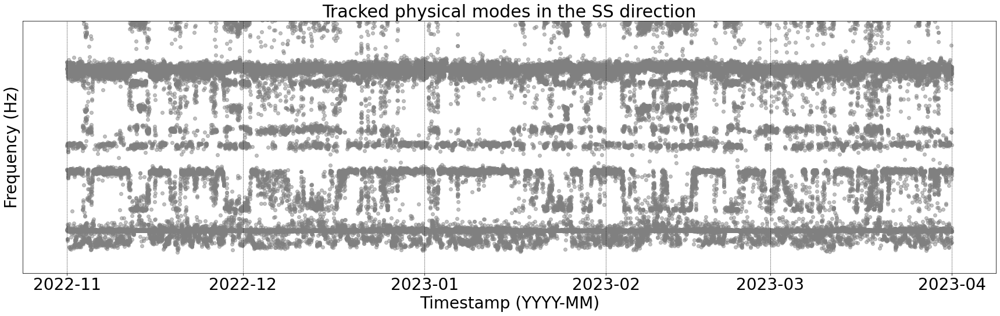

In [6]:
direction = 'SS'
mc = {}
clustered_modes = {}
plt.rcParams.update({'font.size': 28})  # Set the font size to 12


clustering_data[direction] = mpe_data[direction].rename(columns={'mean_frequency':'frequency', 'mean_damping':'damping', 'size':'size'}) #harmonics_removed[direction]

plt.figure(figsize=(30,8))

plt.scatter(clustering_data[direction].index, clustering_data[direction]['frequency'], alpha=0.5, color='grey')

tab10 = plt.get_cmap('tab10')

#im = plt.scatter(clustered_modes[direction].index, clustered_modes[direction]['frequency'], c=clustered_modes[direction]['labels'], cmap = cmap)
plt.scatter([], [], c='#FF800E')
#plt.legend(['harmonics removed modes', 'SS1', 'SS2'])
plt.grid(True, color='k', linestyle='--', linewidth=0.5)

plt.xlabel('Timestamp (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked physical modes in the SS direction', fontsize=30)
plt.ylim(0, 1.3)
plt.yticks([])

plt.show()

#SS1_harmonics_removed = clustered_modes[direction][clustered_modes[direction].labels == 0]
#SS1_harmonics_removed = SS1_harmonics_removed[~SS1_harmonics_removed.index.duplicated()].reindex(clustering_data[direction][~clustering_data[direction].index.duplicated()].index)
#SS2_harmonics_removed = clustered_modes[direction][clustered_modes[direction].labels == 1]
#SS2_harmonics_removed = SS2_harmonics_removed[~SS2_harmonics_removed.index.duplicated()].reindex(clustering_data[direction][~clustering_data[direction].index.duplicated()].index)

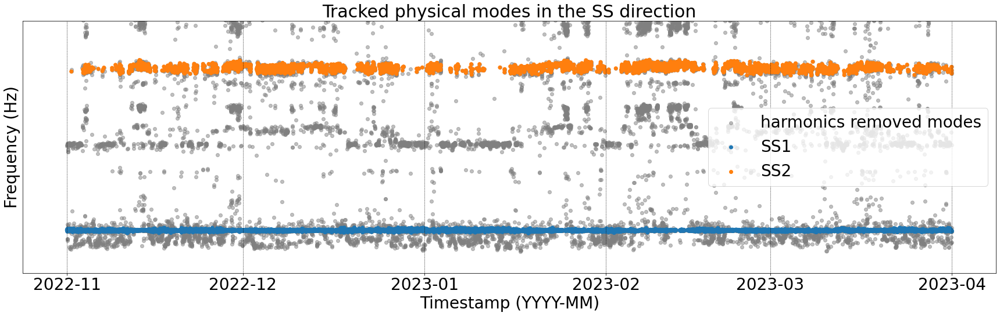

In [7]:
direction = 'SS'
mc = {}
clustered_modes = {}
plt.rcParams.update({'font.size': 28})  # Set the font size to 12


mc[direction] = ModeClusterer(
    eps = 4,
    min_samples = 20,
    multipliers = {"frequency": 500, "size": 2, "damping": 5},
    index_divider = 2000,
    cols = ["frequency", "size", "damping"],
    min_size = 10,
    max_damping = 10,)

clustering_data[direction] = harmonics_removed[direction]
mc[direction].fit(clustering_data[direction])
clustered_modes[direction] = mc[direction].predict(min_cluster_size=2000)

plt.figure(figsize=(30,8))

plt.scatter(clustering_data[direction].index, clustering_data[direction]['frequency'], alpha=0.5, color='grey')

tab10 = plt.get_cmap('tab10')
first_colors = tab10(range(0,len(clustered_modes[direction].labels.unique()),1))
cmap = ListedColormap(first_colors)

im = plt.scatter(clustered_modes[direction].index, clustered_modes[direction]['frequency'], c=clustered_modes[direction]['labels'], cmap = cmap)
plt.scatter([], [], c='#FF800E')
plt.legend(['harmonics removed modes', 'SS1', 'SS2'])
plt.grid(True, color='k', linestyle='--', linewidth=0.5)

plt.xlabel('Timestamp (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked physical modes in the SS direction', fontsize=30)
plt.ylim(0, 1.3)
plt.yticks([])

plt.show()

SS1_harmonics_removed = clustered_modes[direction][clustered_modes[direction].labels == 0]
SS1_harmonics_removed = SS1_harmonics_removed[~SS1_harmonics_removed.index.duplicated()].reindex(clustering_data[direction][~clustering_data[direction].index.duplicated()].index)
SS2_harmonics_removed = clustered_modes[direction][clustered_modes[direction].labels == 1]
SS2_harmonics_removed = SS2_harmonics_removed[~SS2_harmonics_removed.index.duplicated()].reindex(clustering_data[direction][~clustering_data[direction].index.duplicated()].index)

In [8]:
# Data Transformation
mode_simulation_data = {
    'SS1': pd.DataFrame(),
    'FA1': pd.DataFrame(),
    'SS2': pd.DataFrame(),
    'FA2': pd.DataFrame(),
}
for key in simulation_data.keys():
    if 'Eigen_' in key:
        simulation_data[key].rename(
            columns={
                '1st SS': 'SS1',
                '1st FA': 'FA1',
                '2nd SS': 'SS2',
                '2nd FA': 'FA2',
            }, inplace=True
        )
        for mode in ['SS1', 'FA1', 'SS2', 'FA2']:
            mode_simulation_data[mode][key] = simulation_data[key][mode]

# order the columns
cols = list(simulation_data.keys())
ordered_cols = [cols[0]] + cols[9:11] + cols[1:9] + [cols[11]] + cols[20:22] + cols[12:20]
for mode in ['SS1', 'FA1', 'SS2', 'FA2']:
    mode_simulation_data[mode] = mode_simulation_data[mode][ordered_cols]
    mode_simulation_data[mode].to_csv(simulations_data_path + "mode_frequencies/" + mode + ".csv")

tracked_modes = \
    tracked_frequencies.rename(
        columns = {
            'FA1': '1st FA',
            'FA2': '2nd FA',
            'SS1': '1st SS',
            'SS2': '2nd SS',
        }
    )

In [13]:
import mlflow
models = {}
for mode in tracked_frequencies.columns:
    model_name = 'mpe_' + name_location + '_' + mode + '_normalization'
    stage = 'Staging'
    try:
        models[mode] = \
            mlflow.pyfunc.load_model(
                model_uri=f"models:/{model_name}/{stage}")
    except:
        print('no ' + stage + ' model ' + model_name)

no Staging model mpe_NW2_D01_SS1_normalization


In [ ]:
from oma_tracking.data.make_dataset import get_scada_subset, get_weather_subset

weather_inputs = get_weather_subset(mvbc_data)
scada_inputs = get_scada_subset(data)

inputs = \
    pd.concat(
        [
            weather_inputs,
            scada_inputs
        ],
        axis=1
    )

prediction_params = \
    tracked_frequencies 

predictions = pd.DataFrame(index = inputs.dropna().index)
for mode in models.keys():
    predictions[mode] = models[mode].predict(inputs.dropna())
residuals = tracked_frequencies - predictions
normalized = residuals + tracked_frequencies.mean()

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\seaborn\distributions.py:1689: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\seaborn\distributions.py:1689: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)
c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\seaborn\distributions.py:1689: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)


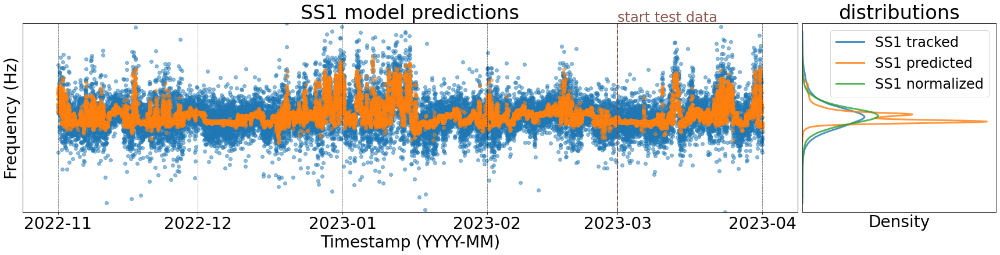

c:\Users\Max\anaconda3\envs\soiltwin\lib\site-packages\seaborn\distributions.py:1689: FutureWarning: The `vertical` parameter is deprecated and will be removed in a future version. Assign the data to the `y` variable instead.
  warnings.warn(msg, FutureWarning)


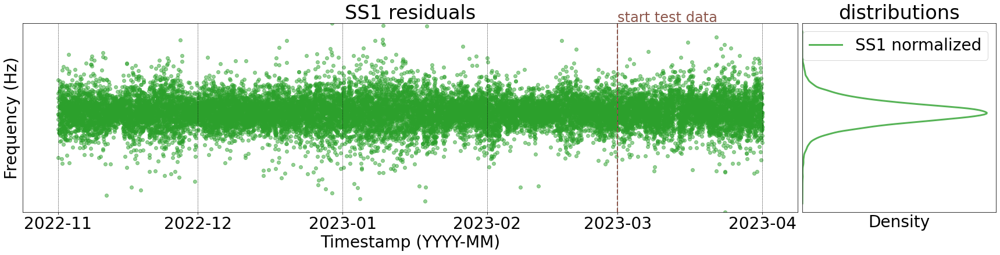

In [ ]:
import numpy as np 
import matplotlib.gridspec as gridspec
import seaborn as sns
end_training = datetime.datetime(2023, 3, 1)
end_test = datetime.datetime(2023, 4, 1)
mode = 'SS1'

# Create a grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(30, 6))
grid = gridspec.GridSpec(1, 2, width_ratios=[8, 2])
ax1 = plt.subplot(grid[0])
ax1.scatter(tracked_frequencies[mode].index, tracked_frequencies[mode], label = 'SS1 tracked', alpha = 0.5)
ax1.scatter(predictions[mode].index, predictions[mode], label = 'SS1 predicted', alpha=0.5)
ax1.set_ylabel('Frequency (Hz)')
ax1.set_xlabel('Timestamp (YYYY-MM)')
ax1.set_title(mode + ' model predictions')
ax1.set_yticks([])
ax1.grid(True, color='k', linestyle='--', linewidth=0.5)
ax1.vlines(end_training, tracked_frequencies[mode].min(), tracked_frequencies[mode].max(), color='tab:brown', linestyle='--', linewidth=2)
ax1.text(end_training, tracked_frequencies[mode].max()+0.0002, 'start test data', color='tab:brown', rotation=0, fontsize=24)
ax1.set_ylim(tracked_frequencies[mode].min(), tracked_frequencies[mode].max())

ax2 = plt.subplot(grid[1])
ax2.set_title('distributions')
sns.kdeplot(tracked_frequencies[mode].values, label='SS1 tracked', ax=ax2, alpha=0.8, vertical=True, linewidth=3)
sns.kdeplot(predictions[mode].values, label='SS1 predicted', ax=ax2, alpha=0.8, vertical=True, linewidth=3)
sns.kdeplot(normalized[mode].values, label='SS1 normalized', ax=ax2, alpha=0.8, vertical=True, linewidth=3)

ax2.set_yticks([])
ax2.set_xticks([])

# Rotate the y-axis labels of the KDE plot
for tick in ax2.get_yticklabels():
    tick.set_rotation(90)

#ax2.hist(tracked_frequencies[mode].values, density=False, label='SS1 tracked', bins=1000, orientation='horizontal', alpha=0.8, histtype='stepfilled')
#ax2.hist(predictions[mode].values, density=False, label='SS1 predicted', bins=1000, orientation='horizontal', alpha=0.8, histtype='stepfilled')
#ax2.hist(normalized[mode].values, density=False, label='SS1 normalized', bins=1000, orientation='horizontal', alpha=0.8, histtype='stepfilled')

ax2.grid(True, color='k', linestyle='--', linewidth=0.5)
# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.01)
legend = plt.legend()
legend.set_alpha(1.0)  # Remove alpha from the legend
# Remove alpha from the legend items
for text in legend.get_texts():
    text.set_alpha(1.0)
plt.legend(fontsize=24)
plt.show()


# Create a grid of subplots
fig, axs = plt.subplots(1, 2, figsize=(30, 6))
grid = gridspec.GridSpec(1, 2, width_ratios=[8, 2])
ax1 = plt.subplot(grid[0])
ax1.scatter(residuals[mode].index, residuals[mode], label = 'SS1 residuals', alpha=0.5, c='tab:green')

ax1.set_ylabel('Frequency (Hz)')
ax1.set_title(mode + ' residuals')
ax1.set_yticks([])
ax1.grid(True, color='k', linestyle='--', linewidth=0.5)
ax1.vlines(end_training, residuals[mode].min(), residuals[mode].max(), color='tab:brown', linestyle='--', linewidth=2)
ax1.text(end_training, residuals[mode].max()+0.0002, 'start test data', color='tab:brown', rotation=0, fontsize=24)
ax1.set_ylim(residuals[mode].min(), residuals[mode].max())
ax1.set_xlabel('Timestamp (YYYY-MM)')

ax2 = plt.subplot(grid[1])
ax2.set_title('distributions')
sns.kdeplot(residuals[mode].values, label='SS1 normalized', ax=ax2, alpha=0.8, vertical=True, color='tab:green', linewidth=3)
ax2.grid(True, color='k', linestyle='--', linewidth=0.5)

ax2.set_yticks([])
ax2.set_xticks([])

# Rotate the y-axis labels of the KDE plot
for tick in ax2.get_yticklabels():
    tick.set_rotation(90)

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.01)
legend = plt.legend()
# Remove alpha from the legend items
for text in legend.get_texts():
    text.set_alpha(1.0)
plt.legend()
plt.show()

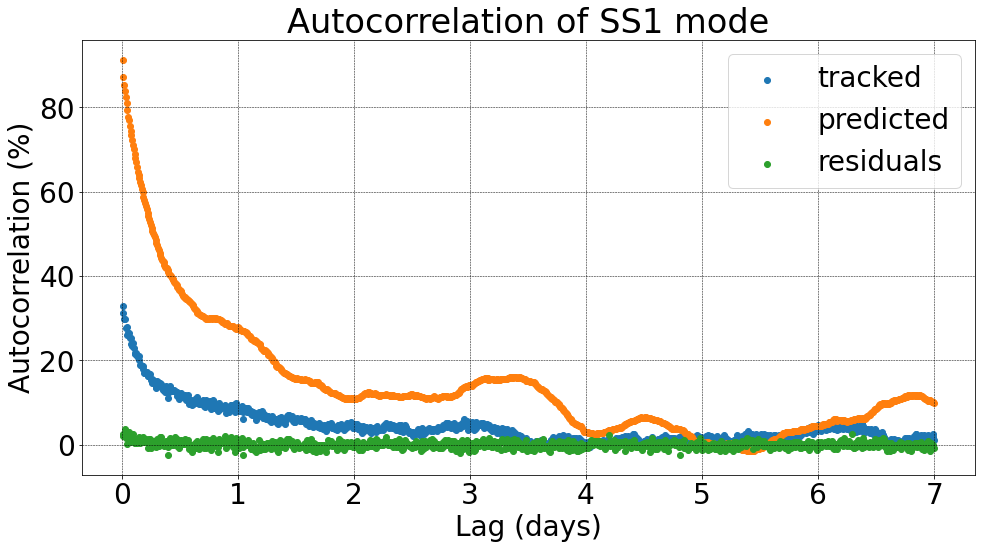

In [ ]:
mode = 'SS1'
import statsmodels.api as sm

# Compute autocorrelation using the acf() function
autocorr_values_tracked = sm.tsa.acf(tracked_frequencies[mode].dropna(), nlags=7*144)
autocorr_values_predicted = sm.tsa.acf(predictions[mode].dropna(), nlags=7*144)

autocorr_values_residuals = sm.tsa.acf(residuals[mode].dropna(), nlags=7*144)

plt.figure(figsize=(16,8))
plt.scatter(range(1, len(autocorr_values_tracked)), 100*autocorr_values_tracked[1:])
plt.scatter(range(1, len(autocorr_values_predicted)), 100*autocorr_values_predicted[1:])
plt.scatter(range(1, len(autocorr_values_residuals)), 100*autocorr_values_residuals[1:])
plt.ylabel('Autocorrelation (%)')
plt.xlabel('Lag (days)')

# Customizing the x-axis ticks
tick_interval = 144  # Interval between ticks
tick_locations = np.arange(0, len(autocorr_values_residuals), tick_interval)  # Generate tick locations

# Generate tick labels based on tick locations
tick_labels = [str(i // tick_interval) for i in tick_locations]

plt.xticks(tick_locations, tick_labels)  # Set the custom ticks and labels
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
plt.legend(['tracked', 'predicted', 'residuals'])
plt.title('Autocorrelation of ' + mode + ' mode')
plt.show()

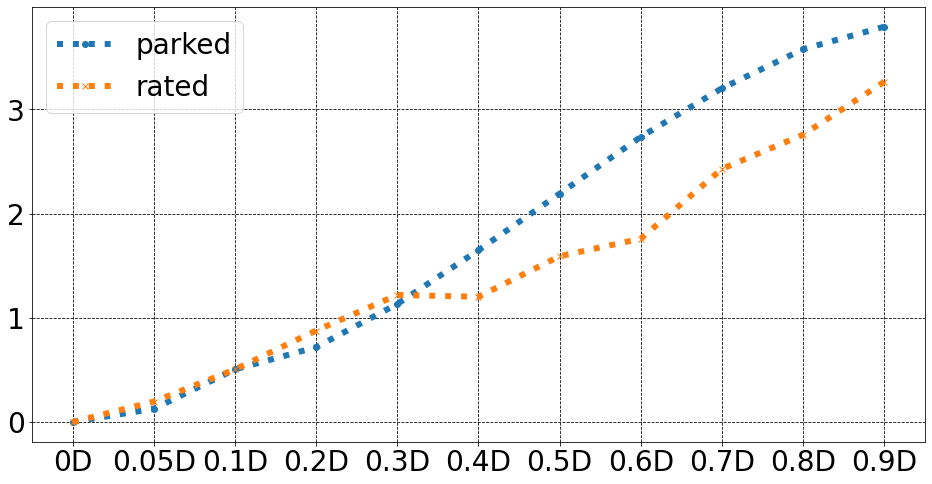

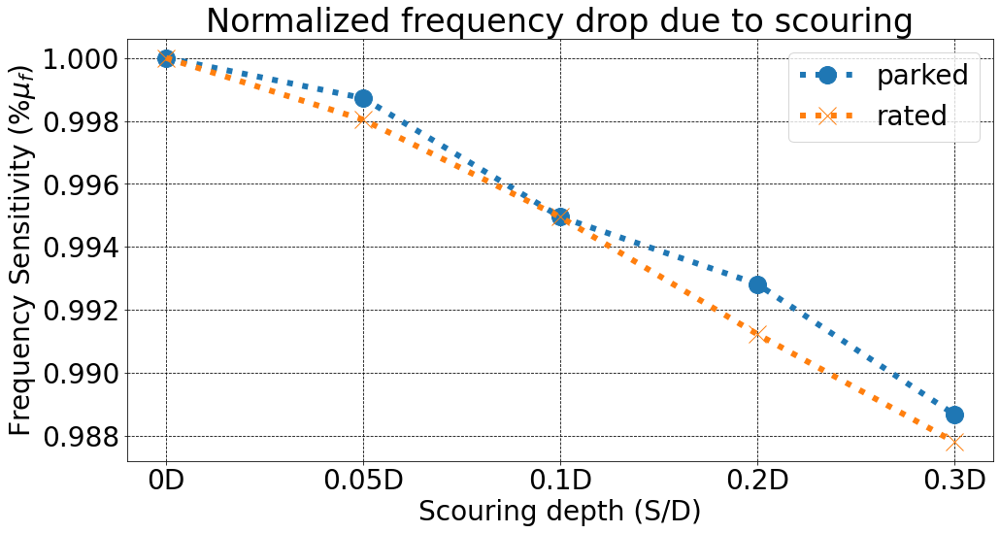

In [9]:
parked_decrease = {}
rated_decrease = {}
mode = 'SS1'
for key in simulation_data.keys():
    mean_mode_parked = simulation_data['Eigen_parked'].loc[:,mode].mean()
    mean_mode_rated = simulation_data['Eigen_rated'].loc[:,mode].mean()
    if 'parked_' in key:
        mean_mode_scenario = simulation_data[key].loc[:,mode].mean()
        mean_decrease = (mean_mode_parked - mean_mode_scenario)/mean_mode_parked * 100
        parked_decrease[key.split("_")[-1]] = mean_decrease
    
    if 'rated_' in key:
        mean_mode_scenario = simulation_data[key].loc[:,mode].mean()
        mean_decrease = (mean_mode_rated - mean_mode_scenario)/mean_mode_rated * 100
        rated_decrease[key.split("_")[-1]] = mean_decrease

# Create a new row as a DataFrame
new_row = pd.DataFrame({0: 0}, index = ['0D'])

parked_decrease = pd.DataFrame(parked_decrease, index=[0]).T
parked_decrease = parked_decrease.loc[parked_decrease.index[-2:].tolist() + parked_decrease.index[:-2].tolist()]
parked_decrease.index = ['0.05D', '0.1D', '0.2D', '0.3D', '0.4D', '0.5D', '0.6D', '0.7D', '0.8D', '0.9D']
parked_decrease = pd.concat([new_row, parked_decrease], axis=0)

rated_decrease = pd.DataFrame(rated_decrease, index=[0]).T
rated_decrease = rated_decrease.loc[rated_decrease.index[-2:].tolist() + rated_decrease.index[:-2].tolist()]
rated_decrease.index = ['0.05D', '0.1D', '0.2D', '0.3D', '0.4D', '0.5D', '0.6D', '0.7D', '0.8D', '0.9D']
rated_decrease = pd.concat([new_row, rated_decrease], axis=0)


plt.figure(figsize=(16,8))
plt.plot(parked_decrease, ':o', label = 'parked',  linewidth=6)
plt.plot(rated_decrease, ':x', label='rated',  linewidth=6)
plt.legend()
plt.grid(True, color='k', linestyle='--',)
plt.show()

#plot as drop


parked_drop = 1 - parked_decrease/100
rated_drop = 1 - rated_decrease/100

plt.figure(figsize=(16,8))
plt.plot(parked_drop[:5], ':o', label = 'parked',  linewidth=6,  markersize=18)
plt.plot(rated_drop[:5], ':x', label='rated',  linewidth=6,  markersize=18)
plt.legend()
plt.grid(True, color='k', linestyle='--',)
plt.ylabel('Frequency Sensitivity (%$\mu_{f}$)')
plt.xlabel('Scouring depth (S/D)')
plt.title('Normalized frequency drop due to scouring')
plt.show()

In [ ]:
from scipy import stats

stds = []
means = []
uncertainty_min = []
uncertainty_max = []
means2 = []
uncertainty_min2 = []
uncertainty_max2 = []
means3 = []
uncertainty_min3 = []
uncertainty_max3 = []

start1 = datetime.datetime(2023,3,7)
start2 = datetime.datetime(2023,3,14)


confidence = 0.99
z = stats.norm.ppf((1 + confidence) / 2)
var_training = residuals[mode].loc[:end_training].var(ddof=1)
for i in range(1,144*14):
    std = z*np.sqrt(var_training/i) # std average   
    stds.append(std)

    mean = residuals[mode].loc[end_training:].iloc[0:i].mean() # mean average
    uncertainty_min.append(mean-std)
    uncertainty_max.append(mean+std)
    means.append(mean)
    means2.append(residuals[mode].loc[start1:].iloc[0:i].mean())
    uncertainty_min2.append(residuals[mode].loc[start1:].iloc[0:i].mean()-std)
    uncertainty_max2.append(residuals[mode].loc[start1:].iloc[0:i].mean()+std)
    means3.append(residuals[mode].loc[start2:].iloc[0:i].mean())
    uncertainty_min3.append(residuals[mode].loc[start2:].iloc[0:i].mean()-std)
    uncertainty_max3.append(residuals[mode].loc[start2:].iloc[0:i].mean()+std)

C:\Users\Max\AppData\Local\Temp\ipykernel_20704\1989456270.py:20: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  var_training = residuals[mode].loc[:end_training].var(ddof=1)
C:\Users\Max\AppData\Local\Temp\ipykernel_20704\1989456270.py:25: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  mean = residuals[mode].loc[end_training:].iloc[0:i].mean() # mean average
C:\Users\Max\AppData\Local\Temp\ipykernel_20704\1989456270.py:29: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  means2.append(residuals[mode].loc[start1:].iloc[0:i].mean())
C:\Users\Max\AppData\Local\Temp\ipykernel_20704\19894

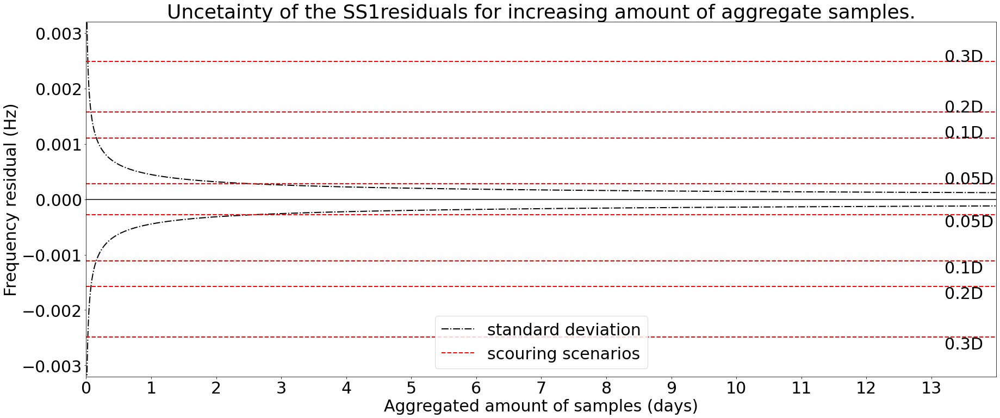

In [ ]:
plt.figure(figsize=(30,12))
plt.rcParams.update({'font.size': 30})  # Set the font size to 12

days_in_plot = 14
plt.axhline(residuals[mode].loc[:end_training].mean(), c='k')
#plt.plot(means, label='aggregated means 1', linewidth=6)
#plt.fill_between(range(len(means)), uncertainty_min, uncertainty_max, color='tab:blue', alpha=0.2) #, label='Uncertainty 1 week later data')

plt.plot(stds, label='standard deviation', color = 'k', linestyle='-.', linewidth=2)
plt.plot([-x for x in stds], color = 'k', linestyle='-.', linewidth=2)

i = 0
label = 'scouring scenarios'
for value in simulation_shifts['parked_scour'][mode].values[:4]:
    plt.axhline(normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
    plt.text((days_in_plot-0.8)*144, normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i])
    plt.axhline(-normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0)
    plt.text((days_in_plot-0.8)*144, -(normalized[mode].mean()*value/100 + 0.00022), simulation_shifts['parked_scour'].index[i])
    i += 1
    label =None

# Customizing the x-axis ticks
tick_interval = 144  # Interval between ticks
tick_locations = np.arange(0, len(stds), tick_interval)  # Generate tick locations

# Generate tick labels based on tick locations
tick_labels = [str(i // tick_interval) for i in tick_locations]

plt.xticks(tick_locations, tick_labels)  # Set the custom ticks and labels

plt.xlabel('Aggregated amount of samples (days)')
plt.ylabel('Frequency residual (Hz)')
plt.legend(loc='lower center')
plt.title('Uncetainty of the ' + mode + 'residuals for increasing amount of aggregate samples.')
#plt.grid(True, color='k', linestyle='--')
plt.ylim(-0.0032, 0.0032)
plt.xlim(0, 144*days_in_plot)
plt.show()

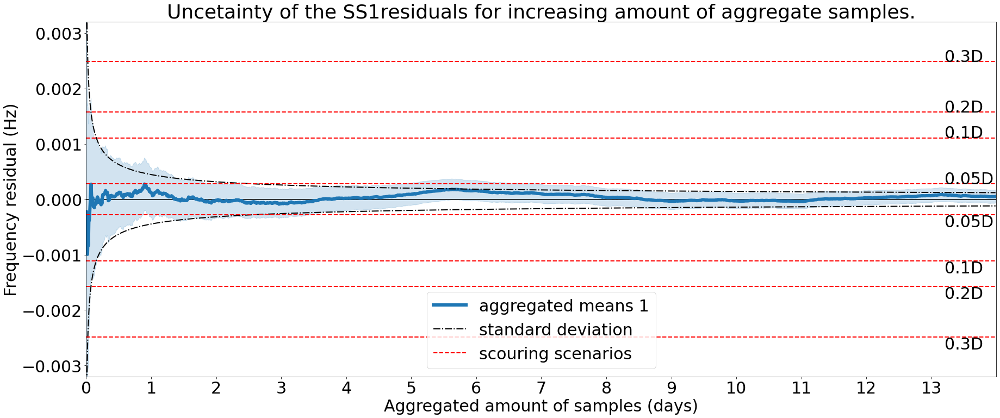

In [ ]:
plt.figure(figsize=(30,12))
plt.rcParams.update({'font.size': 30})  # Set the font size to 12

days_in_plot = 14
plt.axhline(residuals[mode].loc[:end_training].mean(), c='k')
plt.plot(means, label='aggregated means 1', linewidth=6)
plt.fill_between(range(len(means)), uncertainty_min, uncertainty_max, color='tab:blue', alpha=0.2) #, label='Uncertainty 1 week later data')

plt.plot(stds, label='standard deviation', color = 'k', linestyle='-.', linewidth=2)
plt.plot([-x for x in stds], color = 'k', linestyle='-.', linewidth=2)

i = 0
label = 'scouring scenarios'
for value in simulation_shifts['parked_scour'][mode].values[:4]:
    plt.axhline(normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
    plt.text((days_in_plot-0.8)*144, normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i])
    plt.axhline(-normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0)
    plt.text((days_in_plot-0.8)*144, -(normalized[mode].mean()*value/100 + 0.00022), simulation_shifts['parked_scour'].index[i])
    i += 1
    label =None

# Customizing the x-axis ticks
tick_interval = 144  # Interval between ticks
tick_locations = np.arange(0, len(stds), tick_interval)  # Generate tick locations

# Generate tick labels based on tick locations
tick_labels = [str(i // tick_interval) for i in tick_locations]

plt.xticks(tick_locations, tick_labels)  # Set the custom ticks and labels

plt.xlabel('Aggregated amount of samples (days)')
plt.ylabel('Frequency residual (Hz)')
plt.legend(loc='lower center')
plt.title('Uncetainty of the ' + mode + 'residuals for increasing amount of aggregate samples.')
#plt.grid(True, color='k', linestyle='--')
plt.ylim(-0.0032, 0.0032)
plt.xlim(0, 144*days_in_plot)
plt.show()

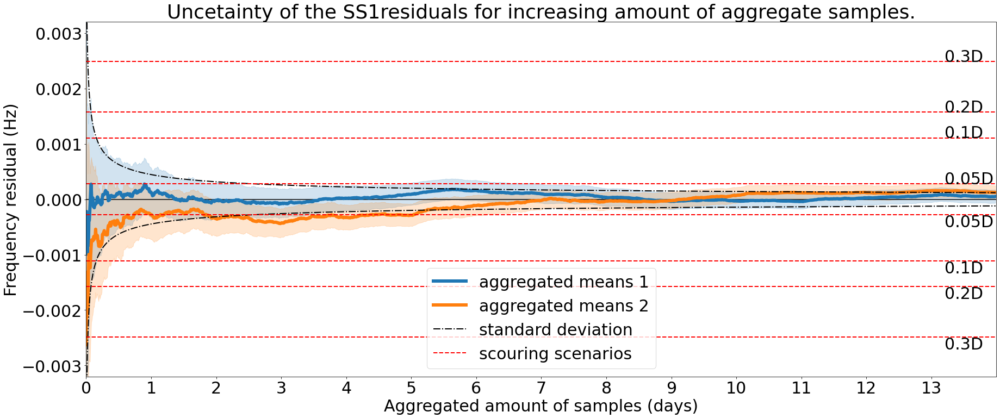

In [ ]:
plt.figure(figsize=(30,12))
plt.rcParams.update({'font.size': 30})  # Set the font size to 12

days_in_plot = 14
plt.axhline(residuals[mode].loc[:end_training].mean(), c='k')
plt.plot(means, label='aggregated means 1', linewidth=6)
plt.fill_between(range(len(means)), uncertainty_min, uncertainty_max, color='tab:blue', alpha=0.2) #, label='Uncertainty')
plt.plot(means2, label='aggregated means 2', linewidth=6)
plt.fill_between(range(len(means2)), uncertainty_min2, uncertainty_max2, color='tab:orange', alpha=0.2) #, label='Uncertainty 1 week later data')

plt.plot(stds, label='standard deviation', color = 'k', linestyle='-.', linewidth=2)
plt.plot([-x for x in stds], color = 'k', linestyle='-.', linewidth=2)

i = 0
label = 'scouring scenarios'
for value in simulation_shifts['parked_scour'][mode].values[:4]:
    plt.axhline(normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
    plt.text((days_in_plot-0.8)*144, normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i])
    plt.axhline(-normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0)
    plt.text((days_in_plot-0.8)*144, -(normalized[mode].mean()*value/100 + 0.00022), simulation_shifts['parked_scour'].index[i])
    i += 1
    label =None

# Customizing the x-axis ticks
tick_interval = 144  # Interval between ticks
tick_locations = np.arange(0, len(stds), tick_interval)  # Generate tick locations

# Generate tick labels based on tick locations
tick_labels = [str(i // tick_interval) for i in tick_locations]

plt.xticks(tick_locations, tick_labels)  # Set the custom ticks and labels

plt.xlabel('Aggregated amount of samples (days)')
plt.ylabel('Frequency residual (Hz)')
plt.legend(loc='lower center')
plt.title('Uncetainty of the ' + mode + 'residuals for increasing amount of aggregate samples.')
#plt.grid(True, color='k', linestyle='--')
plt.ylim(-0.0032, 0.0032)
plt.xlim(0, 144*days_in_plot)
plt.show()

C:\Users\Max\AppData\Local\Temp\ipykernel_20704\706857544.py:5: FutureWarning: Indexing a timezone-aware DatetimeIndex with a timezone-naive datetime is deprecated and will raise KeyError in a future version. Use a timezone-aware object instead.
  plt.axhline(residuals[mode].loc[:end_training].mean(), c='k')


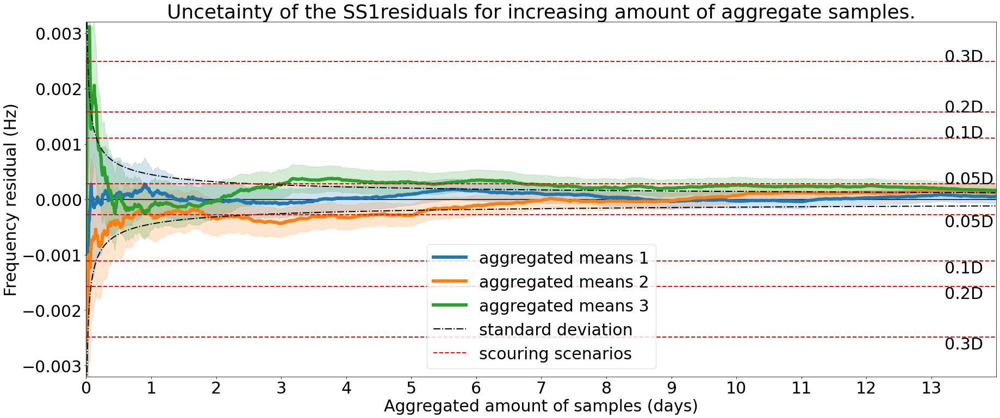

In [ ]:
plt.figure(figsize=(30,12))
plt.rcParams.update({'font.size': 30})  # Set the font size to 12

days_in_plot = 14
plt.axhline(residuals[mode].loc[:end_training].mean(), c='k')
plt.plot(means, label='aggregated means 1', linewidth=6)
plt.fill_between(range(len(means)), uncertainty_min, uncertainty_max, color='tab:blue', alpha=0.2) #, label='Uncertainty')
plt.plot(means2, label='aggregated means 2', linewidth=6)
plt.fill_between(range(len(means2)), uncertainty_min2, uncertainty_max2, color='tab:orange', alpha=0.2) #, label='Uncertainty 1 week later data')
plt.plot(means3, label='aggregated means 3', linewidth=6)
plt.fill_between(range(len(means3)), uncertainty_min3, uncertainty_max3, color='tab:green', alpha=0.2) #, label='Uncertainty 2 weeks later data')

plt.plot(stds, label='standard deviation', color = 'k', linestyle='-.', linewidth=2)
plt.plot([-x for x in stds], color = 'k', linestyle='-.', linewidth=2)

i = 0
label = 'scouring scenarios'
for value in simulation_shifts['parked_scour'][mode].values[:4]:
    plt.axhline(normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
    plt.text((days_in_plot-0.8)*144, normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i])
    plt.axhline(-normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0)
    plt.text((days_in_plot-0.8)*144, -(normalized[mode].mean()*value/100 + 0.00022), simulation_shifts['parked_scour'].index[i])
    i += 1
    label =None

# Customizing the x-axis ticks
tick_interval = 144  # Interval between ticks
tick_locations = np.arange(0, len(stds), tick_interval)  # Generate tick locations

# Generate tick labels based on tick locations
tick_labels = [str(i // tick_interval) for i in tick_locations]

plt.xticks(tick_locations, tick_labels)  # Set the custom ticks and labels

plt.xlabel('Aggregated amount of samples (days)')
plt.ylabel('Frequency residual (Hz)')
plt.legend(loc='lower center')
plt.title('Uncetainty of the ' + mode + 'residuals for increasing amount of aggregate samples.')
#plt.grid(True, color='k', linestyle='--')
plt.ylim(-0.0032, 0.0032)
plt.xlim(0, 144*days_in_plot)
plt.show()

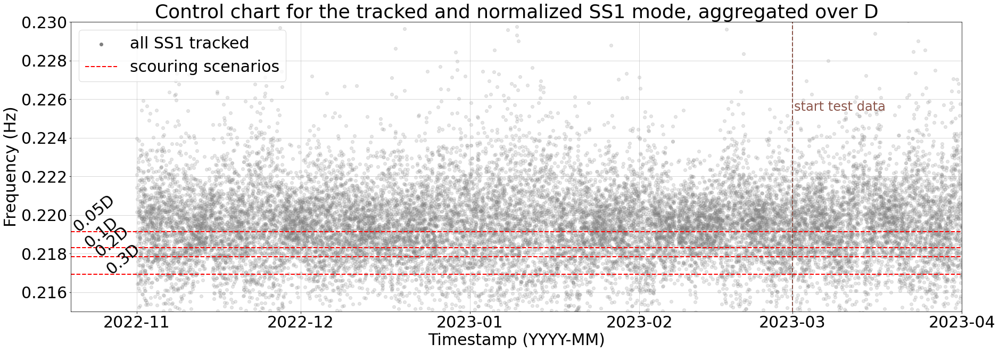

In [ ]:
import warnings
from oma_tracking.scouring.scouring import aggregate_time_series
from matplotlib.collections import PathCollection
from matplotlib.legend_handler import HandlerPathCollection, HandlerLine2D

warnings.filterwarnings('ignore')
markers = ['.', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
timespans = ['D']

confidence = 0.99
z = stats.norm.ppf((1 + confidence) / 2)


for timespan in timespans:
    for mode in ['SS1']:
        plt.figure(figsize=(30,10))
        plt.grid('--', linewidth=0.5)
        plt.title('Control chart for the tracked and normalized ' + mode + ' mode, aggregated over ' + timespan)
        m = 0
        i = 0

        

        timely_tracked_frequencies = aggregate_time_series(tracked_frequencies, timespan)
        timely_normalized_frequencies = aggregate_time_series(normalized, timespan)

        var_training = timely_tracked_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(tracked_frequencies[mode].loc[:end_training])/len(timely_tracked_frequencies[mode]))) # std average  
        std = timely_tracked_frequencies[mode].std()

        plt.scatter(normalized[mode].index, normalized[mode], c='tab:grey', alpha=0.2, label = 'all ' + mode + ' tracked')
        #plt.axhline(tracked_frequencies[mode].mean(), linewidth=2.0, label = 'mean ' + mode, color='tab:blue')
        
        label = 'scouring scenarios'
        for value in simulation_shifts['parked_scour'][mode].values[:4]:
            plt.axhline(normalized[mode].mean() - normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
            plt.text(normalized[mode].index[0] - datetime.timedelta(days=12-2*i), normalized[mode].mean()-normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i], rotation = 40)
            i += 1
            label =None
        #plt.yticks([])
        plt.xlabel('Timestamp (YYYY-MM)')
        plt.ylabel('Frequency (Hz)', )
        plt.ylim(0.215, 0.23)
        plt.vlines(end_training, 0.215, 0.230, color='tab:brown', linestyle='--', linewidth=2)
        plt.text(end_training + datetime.timedelta(hours=6), 0.226 - 0.0006, 'start test data', color='tab:brown', rotation=0, fontsize=24)
        plt.xlim(tracked_frequencies[mode].index[0] - datetime.timedelta(days=12), tracked_frequencies[mode].index[-1])
        
        def update(handle, orig):
            handle.update_from(orig)
            handle.set_alpha(1)

        plt.legend(handler_map={PathCollection : HandlerPathCollection(update_func= update),
                                plt.Line2D : HandlerLine2D(update_func = update)}
                    ,loc='upper left')
        plt.show()

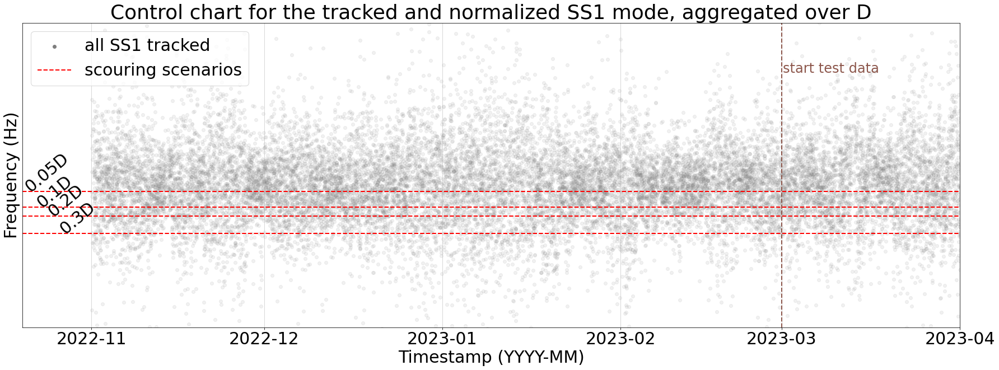

In [ ]:
import warnings
from oma_tracking.scouring.scouring import aggregate_time_series
from matplotlib.collections import PathCollection
from matplotlib.legend_handler import HandlerPathCollection, HandlerLine2D

warnings.filterwarnings('ignore')
markers = ['.', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
timespans = ['D']

confidence = 0.99
z = stats.norm.ppf((1 + confidence) / 2)


for timespan in timespans:
    for mode in ['SS1']:
        plt.figure(figsize=(30,10))
        plt.grid('--', linewidth=0.5)
        plt.title('Control chart for the tracked and normalized ' + mode + ' mode, aggregated over ' + timespan)
        m = 0
        i = 0

        

        timely_tracked_frequencies = aggregate_time_series(tracked_frequencies, timespan)
        timely_normalized_frequencies = aggregate_time_series(normalized, timespan)

        var_training = timely_tracked_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(tracked_frequencies[mode].loc[:end_training])/len(timely_tracked_frequencies[mode]))) # std average  
        std = timely_tracked_frequencies[mode].std()
        #plt.scatter(tracked_frequencies[mode].index, tracked_frequencies[mode], c='tab:grey', alpha=0.2, label = 'all ' + mode + ' tracked')
        plt.scatter(normalized[mode].index, normalized[mode], c='tab:grey', alpha=0.1, label = 'all ' + mode + ' tracked')

        #plt.axhline(tracked_frequencies[mode].mean(), linewidth=2.0, label = 'mean ' + mode, color='tab:blue')
        
        label = 'scouring scenarios'
        for value in simulation_shifts['parked_scour'][mode].values[:4]:
            plt.axhline(normalized[mode].mean() - normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
            plt.text(normalized[mode].index[0] - datetime.timedelta(days=12-2*i), normalized[mode].mean() - normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i], rotation = 40)
            i += 1
            label =None
        plt.yticks([])
        plt.xlabel('Timestamp (YYYY-MM)')
        plt.ylabel('Frequency (Hz)', )
        plt.ylim(0.212, 0.228)
        plt.vlines(end_training, 0.212, 0.230, color='tab:brown', linestyle='--', linewidth=2)
        plt.text(end_training + datetime.timedelta(hours=6), 0.226 - 0.0006, 'start test data', color='tab:brown', rotation=0, fontsize=24)
        plt.xlim(tracked_frequencies[mode].index[0] - datetime.timedelta(days=12), tracked_frequencies[mode].index[-1])
        
        def update(handle, orig):
            handle.update_from(orig)
            handle.set_alpha(1)

        plt.legend(handler_map={PathCollection : HandlerPathCollection(update_func= update),
                                plt.Line2D : HandlerLine2D(update_func = update)}
                    ,loc='upper left')
        plt.show()

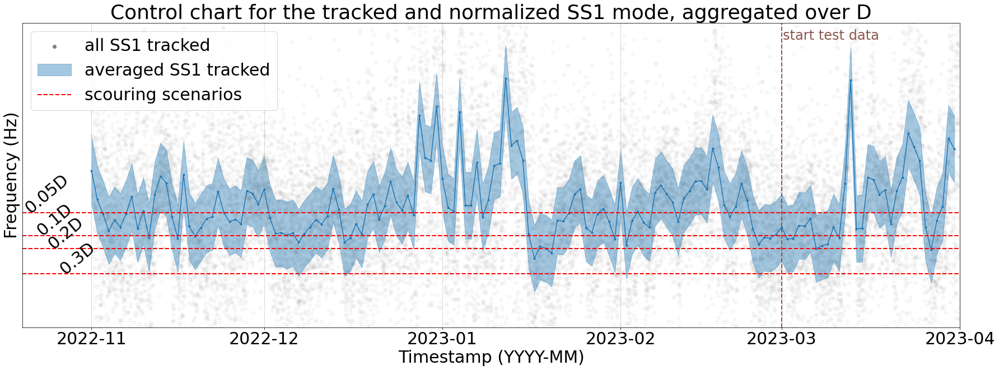

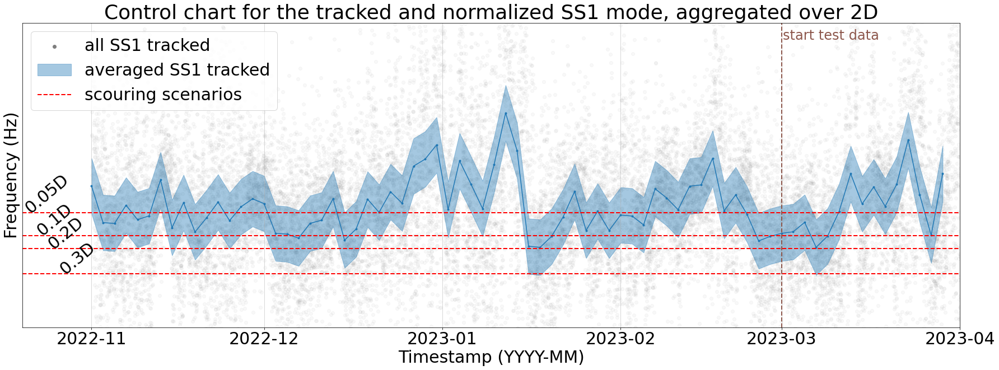

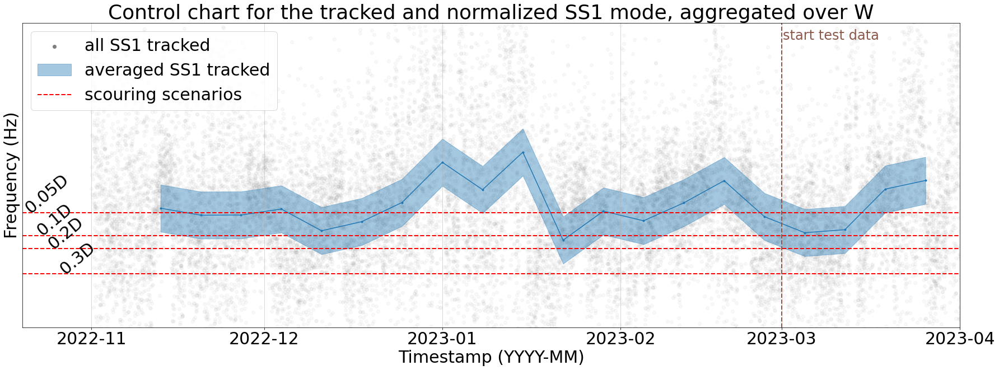

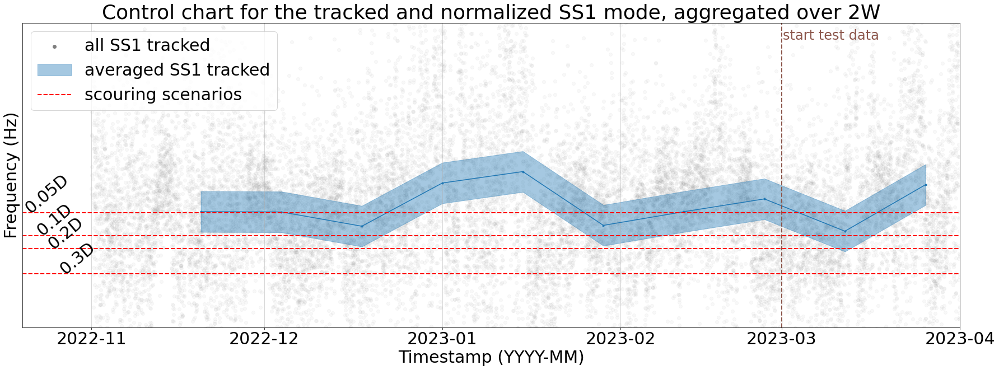

In [ ]:
import warnings
from oma_tracking.scouring.scouring import aggregate_time_series
from matplotlib.collections import PathCollection
from matplotlib.legend_handler import HandlerPathCollection, HandlerLine2D

warnings.filterwarnings('ignore')
markers = ['.', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
timespans = ['D', '2D', 'W', '2W']

confidence = 0.99
z = stats.norm.ppf((1 + confidence) / 2)


for timespan in timespans:
    for mode in ['SS1']:
        plt.figure(figsize=(30,10))
        plt.grid('--', linewidth=0.5)
        plt.title('Control chart for the tracked and normalized ' + mode + ' mode, aggregated over ' + timespan)
        m = 0
        i = 0

        

        timely_tracked_frequencies = aggregate_time_series(tracked_frequencies, timespan)
        timely_normalized_frequencies = aggregate_time_series(normalized, timespan)

        var_training = timely_tracked_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(tracked_frequencies[mode].loc[:end_training])/len(timely_tracked_frequencies[mode]))) # std average  
        std = timely_tracked_frequencies[mode].std()

        plt.scatter(tracked_frequencies[mode].index, tracked_frequencies[mode], c='tab:grey', alpha=0.05, label = 'all ' + mode + ' tracked')
        plt.plot(timely_tracked_frequencies[mode], marker = markers[m])
        plt.fill_between(timely_tracked_frequencies[mode].index, timely_tracked_frequencies[mode] - std, timely_tracked_frequencies[mode] + std, label = 'averaged ' + mode + ' tracked', color='tab:blue', alpha=0.4) #, label='Confidence Interval of normalized mode')

        m += 1
        var_training = timely_normalized_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(normalized[mode].loc[:end_training])/len(timely_normalized_frequencies[mode]))) # std average  
        std = timely_normalized_frequencies[mode].std()
        #plt.plot(timely_normalized_frequencies[mode],  marker = markers[m])
        #plt.fill_between(timely_normalized_frequencies[mode].index, timely_normalized_frequencies[mode] - std, timely_normalized_frequencies[mode] + std, label =  'averaged ' + mode + ' normalized', color='tab:orange', alpha=0.4) #, label='Confidence Interval of normalized mode')
        label = 'scouring scenarios'
        for value in simulation_shifts['parked_scour'][mode].values[:4]:
            plt.axhline(normalized[mode].mean() - normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
            plt.text(normalized[mode].index[0] - datetime.timedelta(days=12-2*i), normalized[mode].mean() - normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i], rotation = 40)
            i += 1
            label =None
        plt.yticks([])
        plt.xlabel('Timestamp (YYYY-MM)')
        plt.ylabel('Frequency (Hz)', )
        plt.ylim(0.215, 0.226)
        plt.vlines(end_training, 0.215, 0.230, color='tab:brown', linestyle='--', linewidth=2)
        plt.text(end_training + datetime.timedelta(hours=6), 0.226 - 0.0006, 'start test data', color='tab:brown', rotation=0, fontsize=24)
        plt.xlim(tracked_frequencies[mode].index[0] - datetime.timedelta(days=12), tracked_frequencies[mode].index[-1])
        
        def update(handle, orig):
            handle.update_from(orig)
            handle.set_alpha(1)

        plt.legend(handler_map={PathCollection : HandlerPathCollection(update_func= update),
                                plt.Line2D : HandlerLine2D(update_func = update)}
                    ,loc='upper left')
        plt.show()

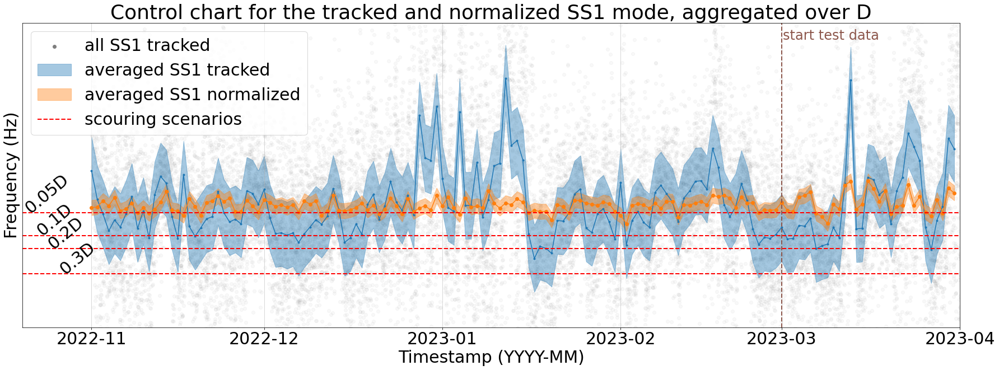

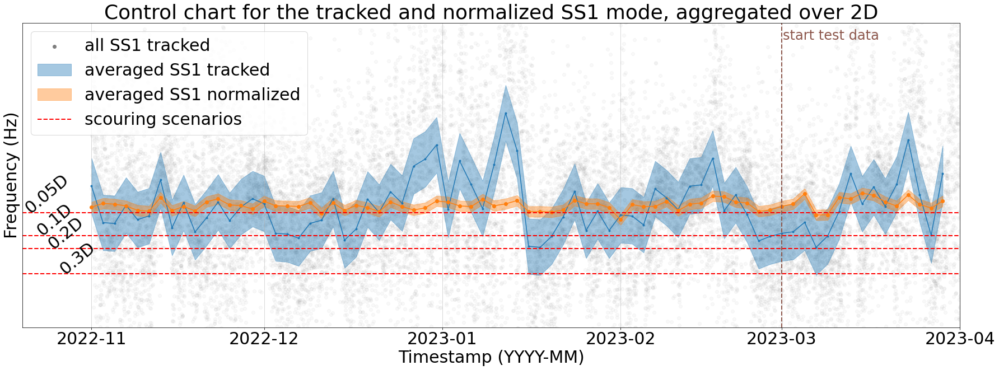

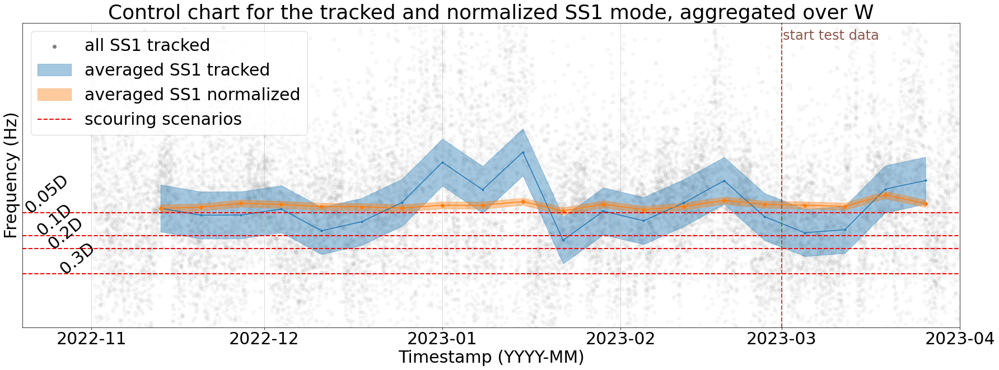

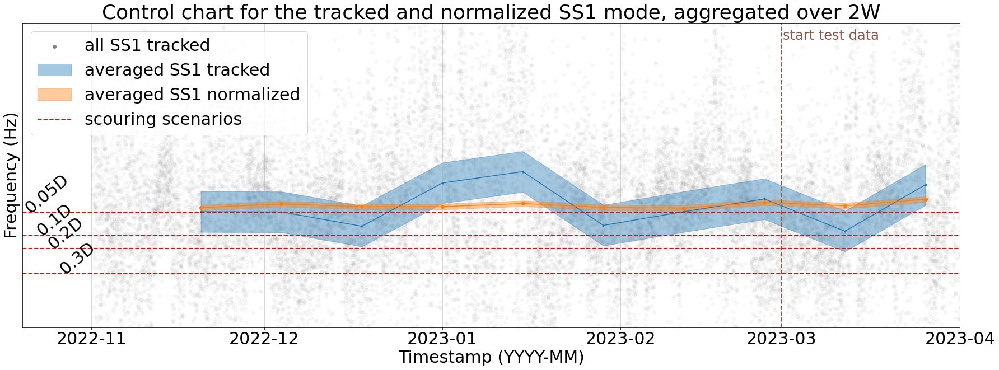

In [ ]:
import warnings
from oma_tracking.scouring.scouring import aggregate_time_series
from matplotlib.collections import PathCollection
from matplotlib.legend_handler import HandlerPathCollection, HandlerLine2D

warnings.filterwarnings('ignore')
markers = ['.', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
timespans = ['D', '2D', 'W', '2W']

confidence = 0.99
z = stats.norm.ppf((1 + confidence) / 2)


for timespan in timespans:
    for mode in ['SS1']:
        plt.figure(figsize=(30,10))
        plt.grid('--', linewidth=0.5)
        plt.title('Control chart for the tracked and normalized ' + mode + ' mode, aggregated over ' + timespan)
        m = 0
        i = 0

        

        timely_tracked_frequencies = aggregate_time_series(tracked_frequencies, timespan)
        timely_normalized_frequencies = aggregate_time_series(normalized, timespan)

        var_training = timely_tracked_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(tracked_frequencies[mode].loc[:end_training])/len(timely_tracked_frequencies[mode]))) # std average  
        std = timely_tracked_frequencies[mode].std()

        plt.scatter(tracked_frequencies[mode].index, tracked_frequencies[mode], c='tab:grey', alpha=0.05, label = 'all ' + mode + ' tracked')
        plt.plot(timely_tracked_frequencies[mode], marker = markers[m])
        plt.fill_between(timely_tracked_frequencies[mode].index, timely_tracked_frequencies[mode] - std, timely_tracked_frequencies[mode] + std, label = 'averaged ' + mode + ' tracked', color='tab:blue', alpha=0.4) #, label='Confidence Interval of normalized mode')

        m += 1
        var_training = timely_normalized_frequencies[mode].loc[:end_training].var(ddof=1)
        std = z*np.sqrt(var_training/(len(normalized[mode].loc[:end_training])/len(timely_normalized_frequencies[mode]))) # std average  
        std = timely_normalized_frequencies[mode].std()
        plt.plot(timely_normalized_frequencies[mode],  marker = markers[m])
        plt.fill_between(timely_normalized_frequencies[mode].index, timely_normalized_frequencies[mode] - std, timely_normalized_frequencies[mode] + std, label =  'averaged ' + mode + ' normalized', color='tab:orange', alpha=0.4) #, label='Confidence Interval of normalized mode')
        label = 'scouring scenarios'
        for value in simulation_shifts['parked_scour'][mode].values[:4]:
            plt.axhline(normalized[mode].mean() - normalized[mode].mean()*value/100, color='red', linestyle='--', linewidth=2.0, label = label)
            plt.text(normalized[mode].index[0] - datetime.timedelta(days=12-2*i), normalized[mode].mean() - normalized[mode].mean()*value/100, simulation_shifts['parked_scour'].index[i], rotation = 40)
            i += 1
            label =None
        plt.yticks([])
        plt.xlabel('Timestamp (YYYY-MM)')
        plt.ylabel('Frequency (Hz)', )
        plt.ylim(0.215, 0.226)
        plt.vlines(end_training, 0.215, 0.230, color='tab:brown', linestyle='--', linewidth=2)
        plt.text(end_training + datetime.timedelta(hours=6), 0.226 - 0.0006, 'start test data', color='tab:brown', rotation=0, fontsize=24)
        plt.xlim(tracked_frequencies[mode].index[0] - datetime.timedelta(days=12), tracked_frequencies[mode].index[-1])
        
        def update(handle, orig):
            handle.update_from(orig)
            handle.set_alpha(1)

        plt.legend(handler_map={PathCollection : HandlerPathCollection(update_func= update),
                                plt.Line2D : HandlerLine2D(update_func = update)}
                    ,loc='upper left')
        plt.show()